In [30]:
import pandas as pd 
import numpy as np 
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import LabelEncoder, StandardScaler, PolynomialFeatures
from sklearn.linear_model import LinearRegression
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.pyplot as plt
from sklearn.tree import plot_tree
import matplotlib.pyplot as plt
import seaborn as sns
from tabulate import tabulate
from ydata_profiling import ProfileReport
from datetime import datetime
from sklearn.ensemble import GradientBoostingRegressor
%matplotlib inline


In [3]:
pd.set_option('display.max_colum',None)
pd.set_option('display.max_rows',None)

In [4]:
df = pd.read_csv('datacsi.csv',encoding='windows-1252')
# df

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10006 entries, 0 to 10005
Data columns (total 20 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Order ID       10006 non-null  object 
 1   Order Date     10006 non-null  object 
 2   Ship Date      10006 non-null  object 
 3   Ship Mode      10006 non-null  object 
 4   Customer ID    10006 non-null  object 
 5   Customer Name  10006 non-null  object 
 6   Segment        10006 non-null  object 
 7   Country        10006 non-null  object 
 8   City           10006 non-null  object 
 9   State          10006 non-null  object 
 10  Postal Code    10006 non-null  int64  
 11  Region         10006 non-null  object 
 12  Product ID     10006 non-null  object 
 13  Category       10006 non-null  object 
 14  Sub-Category   10005 non-null  object 
 15  Product Name   10006 non-null  object 
 16  Sales          9999 non-null   float64
 17  Quantity       10006 non-null  int64  
 18  Discou

In [6]:
print(df.columns)
print(tabulate(df.head(), headers='keys', tablefmt='pretty', showindex=False))
print('*'*50)
print(tabulate(df.tail(), headers='keys', tablefmt='pretty', showindex=False))

Index(['Order ID', 'Order Date', 'Ship Date', 'Ship Mode', 'Customer ID',
       'Customer Name', 'Segment', 'Country', 'City', 'State', 'Postal Code',
       'Region', 'Product ID', 'Category', 'Sub-Category', 'Product Name',
       'Sales', 'Quantity', 'Discount', 'Profit'],
      dtype='object')
+----------------+------------+------------+----------------+-------------+-----------------+-----------+---------------+-----------------+------------+-------------+--------+-----------------+-----------------+--------------+-------------------------------------------------------------+----------+----------+----------+----------+
|    Order ID    | Order Date | Ship Date  |   Ship Mode    | Customer ID |  Customer Name  |  Segment  |    Country    |      City       |   State    | Postal Code | Region |   Product ID    |    Category     | Sub-Category |                        Product Name                         |  Sales   | Quantity | Discount |  Profit  |
+----------------+------------+---

In [7]:
op= ProfileReport(df)#pip install ipywidgets
op



Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [8]:
df.drop_duplicates(inplace=True)
df.dropna(inplace=True)


In [9]:
op= ProfileReport(df)#pip install ipywidgets
op

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [10]:
prod_sal = pd.DataFrame(df.groupby(["Product Name","Category"]).sum()["Sales"].sort_values(ascending=False))
top_sal=prod_sal.head(10)

In [11]:

top_sal

,,Sales
Product Name,Category,
Canon imageCLASS 2200 Advanced Copier,Technology,61599.824
Fellowes PB500 Electric Punch Plastic Comb Binding Machine with Manual Bind,Office Supplies,27453.384
Cisco TelePresence System EX90 Videoconferencing Unit,Technology,22638.480
HON 5400 Series Task Chairs for Big and Tall,Furniture,21870.576
GBC DocuBind TL300 Electric Binding System,Office Supplies,19823.479
GBC Ibimaster 500 Manual ProClick Binding System,Office Supplies,19024.500
Hewlett Packard LaserJet 3310 Copier,Technology,18839.686
"HP Designjet T520 Inkjet Large Format Printer - 24"" Color",Technology,18374.895
GBC DocuBind P400 Electric Binding System,Office Supplies,17965.068


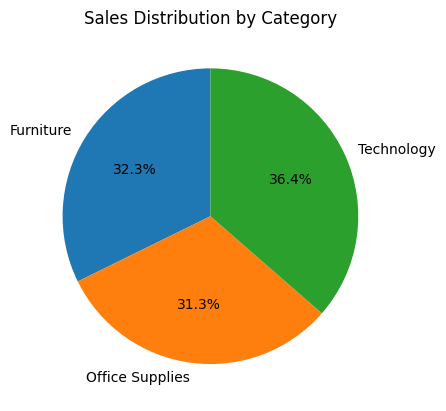

In [12]:

sales_by_category = df.groupby("Category")["Sales"].sum()
plt.pie(
    sales_by_category, 
    labels=sales_by_category.index, 
    autopct='%1.1f%%', 
    startangle=90       
)

plt.title("Sales Distribution by Category")
plt.show()


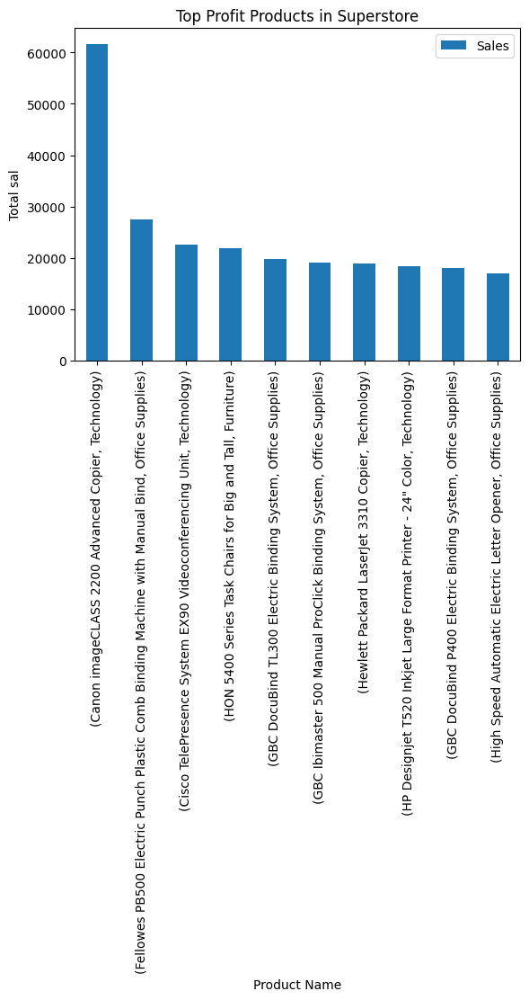

In [13]:
top_sal.plot(kind="bar")

plt.title("Top Profit Products in Superstore")

plt.xlabel("Product Name")
plt.ylabel("Total sal")

plt.show()

In [14]:
prod_profit = pd.DataFrame(df.groupby(["Product Name"]).sum()["Profit"].sort_values(ascending=False))
top_pro=prod_profit.head(10)

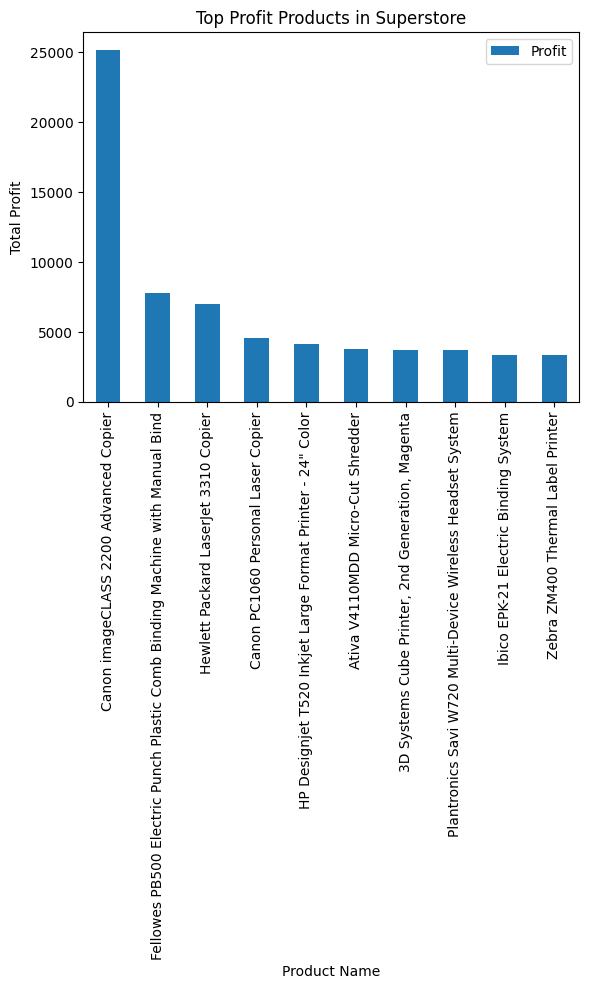

In [15]:
top_pro.plot(kind="bar")

plt.title("Top Profit Products in Superstore")

plt.xlabel("Product Name")
plt.ylabel("Total Profit")

plt.show()

In [16]:
prod_freq= pd.DataFrame(df.groupby(["City"]).sum()["Sales"].sort_values(ascending=False))
top_city=prod_freq.head(10)

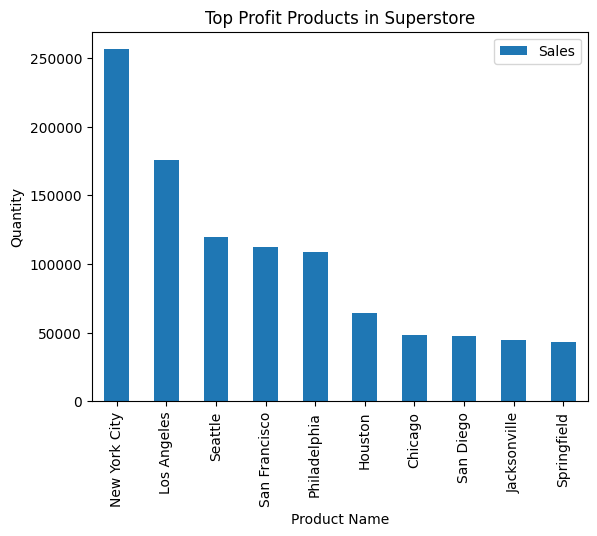

In [17]:
top_city.plot(kind="bar")

plt.title("Top Profit Products in Superstore")

plt.xlabel("Product Name")
plt.ylabel("Quantity")

plt.show()

In [18]:
prod_freq= pd.DataFrame(df.groupby(["City"]).sum()["Profit"].sort_values(ascending=False))
top_city2=prod_freq.head(10)

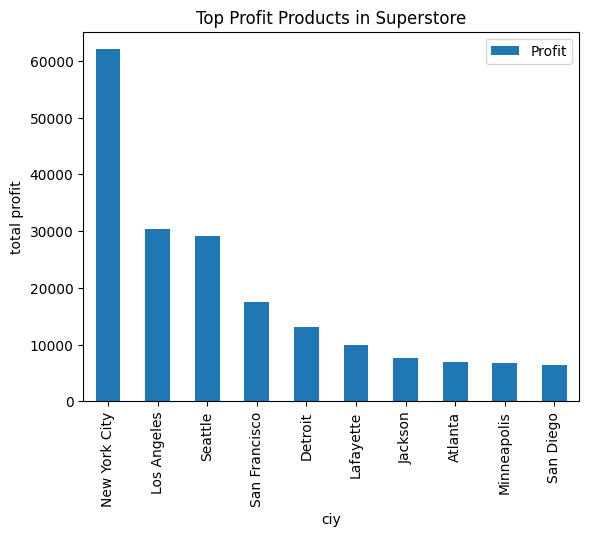

In [19]:
top_city2.plot(kind="bar")

plt.title("Top Profit Products in Superstore")

plt.xlabel("ciy")
plt.ylabel("total profit")

plt.show()

In [20]:
prod_freq= pd.DataFrame(df.groupby(["Customer ID"]).sum()["Sales"].sort_values(ascending=False))
top_cus=prod_freq.head(10)

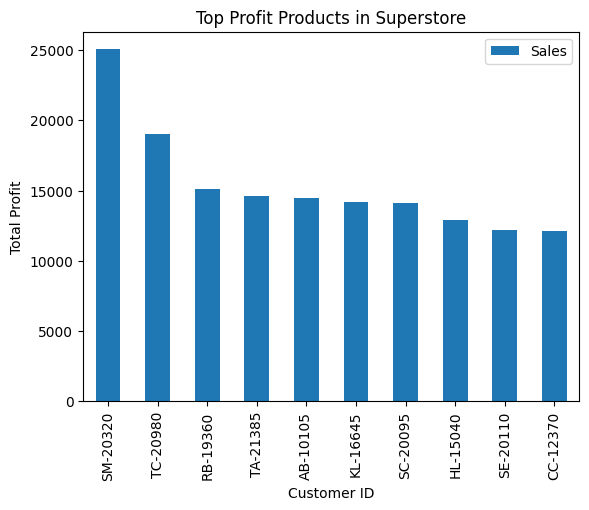

In [21]:
top_cus.plot(kind="bar")

plt.title("Top Profit Products in Superstore")

plt.xlabel("Customer ID")
plt.ylabel("Total Profit")

plt.show()

In [22]:
df['Order Date'] = pd.to_datetime(df['Order Date'], errors='coerce')

In [23]:
df['Order Date'].max() 


Timestamp('2017-12-30 00:00:00')

In [24]:
df['Order Date'].min() 

Timestamp('2014-01-03 00:00:00')

Enter Year(2014 - 2017) 2017


C:\Users\kira\AppData\Local\Temp\ipykernel_6452\1242788482.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_date['Month'] = df_date['Order Date'].dt.month


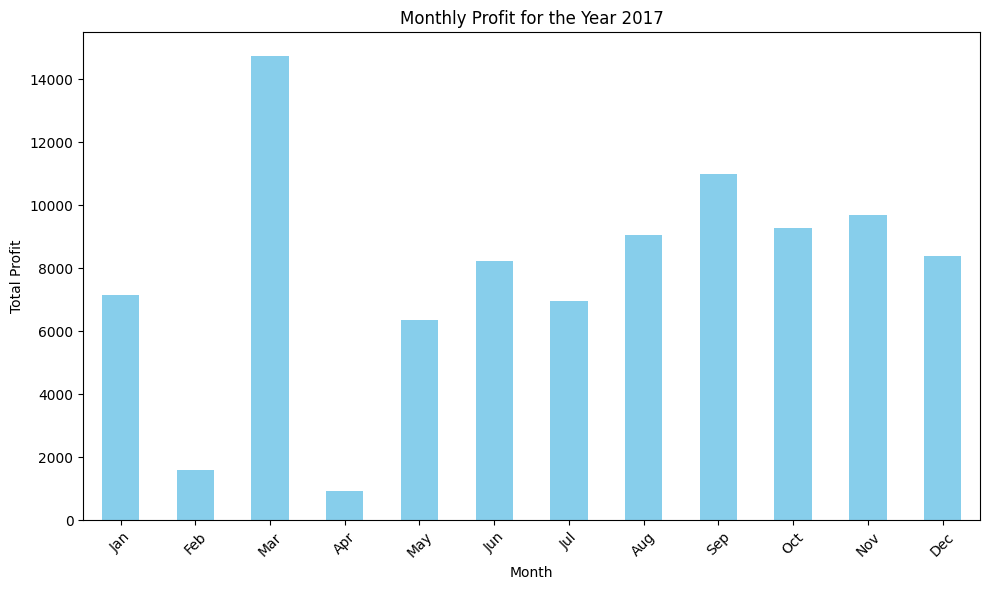

In [26]:
year = int(input("Enter Year(2014 - 2017)"))
filt = (df['Order Date'] >= pd.to_datetime(f'{year}-01-01')) & (df['Order Date'] < pd.to_datetime(f'{year}-12-30'))
df_date = df.loc[filt]

df_date['Month'] = df_date['Order Date'].dt.month

monthly_profit = df_date.groupby('Month')['Profit'].sum()

plt.figure(figsize=(10, 6))
monthly_profit.plot(kind='bar', color='skyblue')
plt.title(f'Monthly Profit for the Year {year}')
plt.xlabel('Month')
plt.ylabel('Total Profit')
plt.xticks(range(12), ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'], rotation=45)
plt.tight_layout()
plt.show()

Root Mean Squared Error (RMSE): 208.0762065586416
R-squared (R2) Score: 0.8584234584570323
Cross-validation mean score: 0.7265001005699554


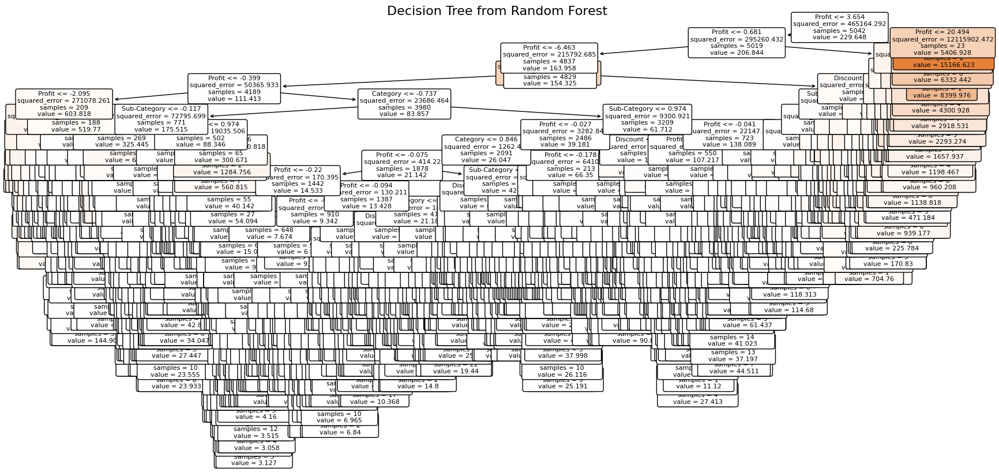

In [27]:

features = df.drop(columns=['Sales','Order ID', 'Order Date', 'Ship Date', 'Customer ID',
                              'Customer Name', 'Product ID', 'Product Name', "Country"])
target = df['Sales']

label_encoders = {}
for col in features.select_dtypes(include=['object']).columns:
    le = LabelEncoder()
    features[col] = le.fit_transform(features[col])
    label_encoders[col] = le

X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=0.2, random_state=42)

scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

model = RandomForestRegressor(n_estimators=300,      
                              random_state=42, 
                              max_depth=None,         
                              min_samples_split=10, 
                              min_samples_leaf=1,    
                              max_features=None)  

model.fit(X_train, y_train)

y_pred = model.predict(X_test)

rmse = np.sqrt(mean_squared_error(y_test, y_pred))
r2 = r2_score(y_test, y_pred)

print("Root Mean Squared Error (RMSE):", rmse)
print("R-squared (R2) Score:", r2)

cv_scores = cross_val_score(model, X_train, y_train, cv=10)  
print("Cross-validation mean score:", np.mean(cv_scores))


tree = model.estimators_[0]  

plt.figure(figsize=(20, 10))
plot_tree(tree, 
          filled=True,            
          feature_names=features.columns,  
          rounded=True,       
          fontsize=8)          

plt.title("Decision Tree from Random Forest", fontsize=16)
plt.show()



Linear Regression - Root Mean Squared Error (RMSE): 476.2636960517096
Linear Regression - R-squared (R2) Score: 0.2582775710745635


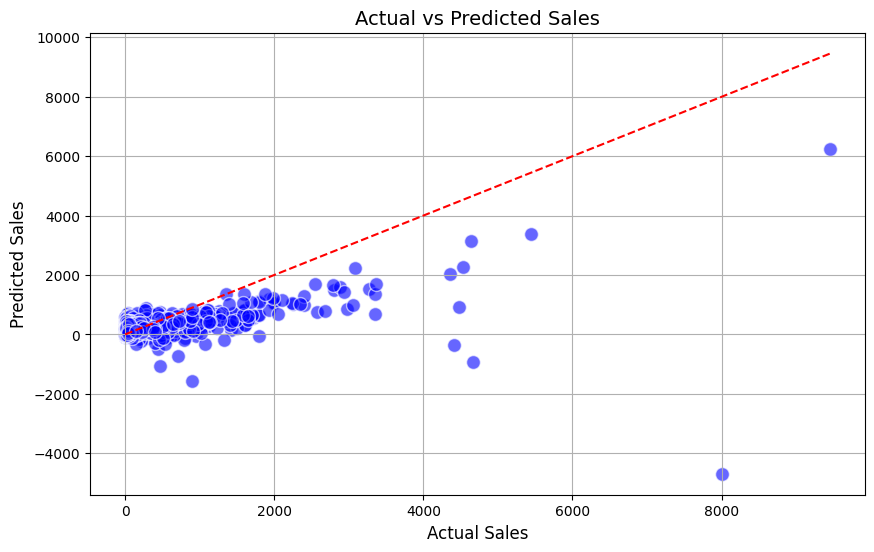

In [28]:

features = df.drop(columns=['Sales', 'Order ID', 'Order Date', 'Ship Date', 'Customer ID',
                              'Customer Name', 'Product ID', 'Product Name', "Country"])
target = df['Sales']

features = features.dropna()  
target = target.loc[features.index]  

label_encoders = {}
for col in features.select_dtypes(include=['object']).columns:
    le = LabelEncoder()
    features[col] = le.fit_transform(features[col])
    label_encoders[col] = le

X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=0.2, random_state=42)

scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

lr_model = LinearRegression()
lr_model.fit(X_train, y_train)

y_pred = lr_model.predict(X_test)

rmse = np.sqrt(mean_squared_error(y_test, y_pred))
r2 = r2_score(y_test, y_pred)

print("Linear Regression - Root Mean Squared Error (RMSE):", rmse)
print("Linear Regression - R-squared (R2) Score:", r2)


plt.figure(figsize=(10, 6))

plt.scatter(y_test, y_pred, color='blue', alpha=0.6, edgecolors='w', s=100)

plt.title('Actual vs Predicted Sales', fontsize=14)
plt.xlabel('Actual Sales', fontsize=12)
plt.ylabel('Predicted Sales', fontsize=12)

plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red', linestyle='--')

plt.grid(True)
plt.show()



Polynomial Regression - Root Mean Squared Error (RMSE): 372.37837806865434
Polynomial Regression - R-squared (R2) Score: 0.5465646573746077


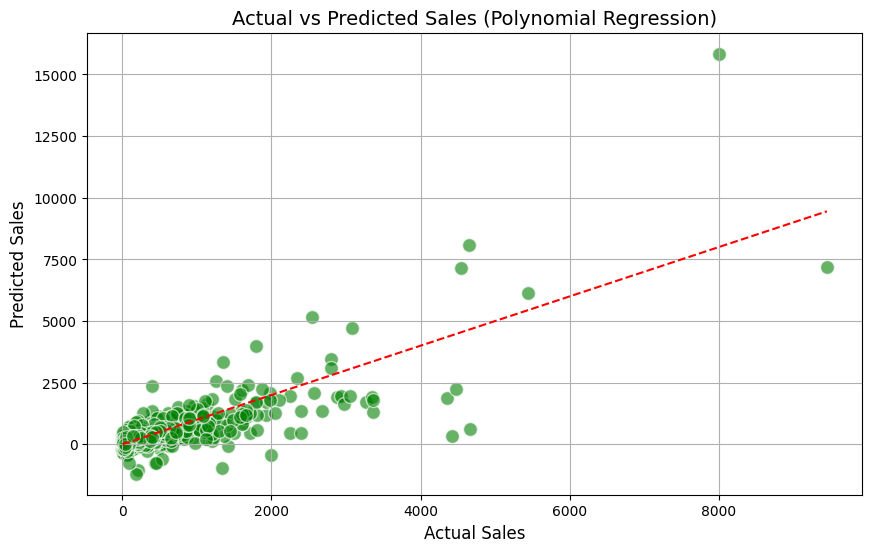

In [31]:


features = df.drop(columns=['Sales','Order ID', 'Order Date', 'Ship Date', 'Customer ID',
                              'Customer Name', 'Product ID', 'Product Name', "Country"])
target = df['Sales']

features = features.dropna() 
target = target.loc[features.index] 

label_encoders = {}
for col in features.select_dtypes(include=['object']).columns:
    le = LabelEncoder()
    features[col] = le.fit_transform(features[col])
    label_encoders[col] = le

X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=0.2, random_state=42)

scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

poly = PolynomialFeatures(degree=3)  
X_train_poly = poly.fit_transform(X_train)
X_test_poly = poly.transform(X_test)

poly_model = LinearRegression()
poly_model.fit(X_train_poly, y_train)

y_pred_poly = poly_model.predict(X_test_poly)
rmse_poly = np.sqrt(mean_squared_error(y_test, y_pred_poly))
r2_poly = r2_score(y_test, y_pred_poly)

print("Polynomial Regression - Root Mean Squared Error (RMSE):", rmse_poly)
print("Polynomial Regression - R-squared (R2) Score:", r2_poly)

plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred_poly, color='green', alpha=0.6, edgecolors='w', s=100)
plt.title('Actual vs Predicted Sales (Polynomial Regression)', fontsize=14)
plt.xlabel('Actual Sales', fontsize=12)
plt.ylabel('Predicted Sales', fontsize=12)
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red', linestyle='--')
plt.grid(True)
plt.show()


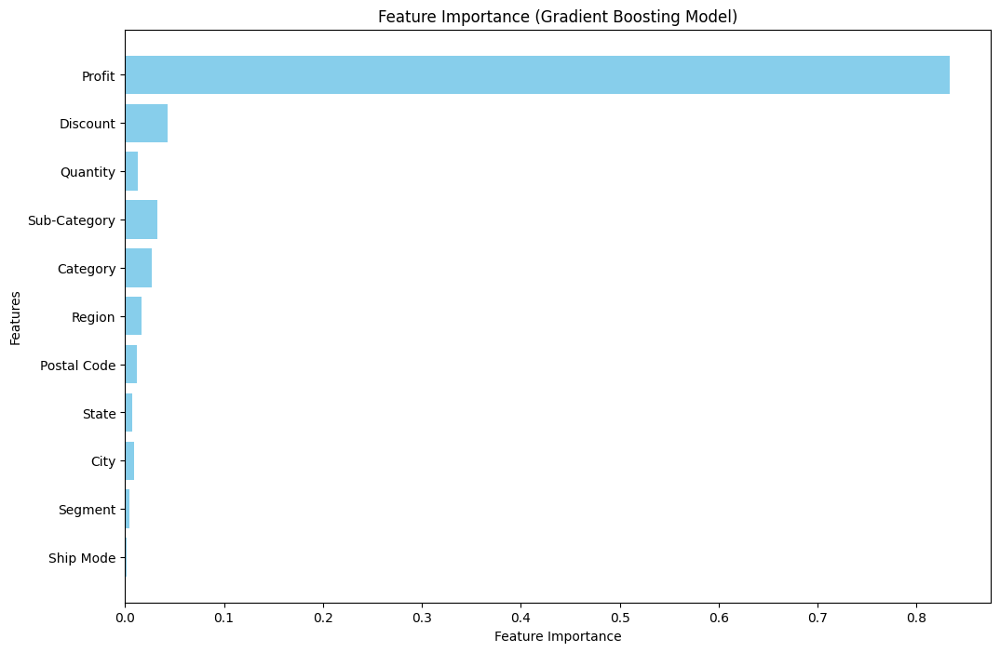

RMSE: 191.32289825733017
R-squared (R2) Score: 0.8803038013475306


In [33]:



columns_to_drop = ['Order ID', 'Order Date', 'Ship Date', 'Customer ID', 
                   'Customer Name', 'Product ID', 'Product Name', 'Country']
features = df.drop(columns=columns_to_drop + ['Sales'])
target = df['Sales']

features = features.dropna()
target = target.loc[features.index]
label_encoders = {}
for col in features.select_dtypes(include='object').columns:
    le = LabelEncoder()
    features[col] = le.fit_transform(features[col])
    label_encoders[col] = le

X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=0.2, random_state=42)

scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

gb_model = GradientBoostingRegressor(n_estimators=200, learning_rate=0.1, max_depth=5, random_state=42)
gb_model.fit(X_train, y_train)

y_pred_gb = gb_model.predict(X_test)

rmse_gb = np.sqrt(mean_squared_error(y_test, y_pred_gb))
r2_gb = r2_score(y_test, y_pred_gb)

feature_importances = gb_model.feature_importances_
feature_names = features.columns

plt.figure(figsize=(12, 8))
plt.barh(feature_names, feature_importances, color='skyblue')
plt.xlabel("Feature Importance")
plt.ylabel("Features")
plt.title("Feature Importance (Gradient Boosting Model)")
plt.show()

print(f"RMSE: {rmse_gb}")
print(f"R-squared (R2) Score: {r2_gb}")

